Refferenced Kaggle Competition Page https://www.kaggle.com/davids1992/speech-representation-and-data-exploration

# Original Page

In [1]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

#Math
import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa

from sklearn.decomposition import PCA

#Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

%matplotlib inline

# Original Page
## 1. Visualization

There are two theories of a human hearing - place ( https://en.wikipedia.org/wiki/Place_theory_(hearing) (frequency-based) and temporal (https://en.wikipedia.org/wiki/Temporal_theory_(hearing) ) In speech recognition, I see two main tendencies - to input spectrogram (frequencies), and more sophisticated features MFCC - Mel-Frequency Cepstral Coefficients, PLP. You rarely work with raw, temporal data.

Let's visualize some recordings!
1.1. Wave and spectrogram:

Choose and read some file:
 

### 1.1. Wave and spectrogram:

Choose and read some file: 

## Introduction

Hello! This is my very first Kernel. It is meant to give a grasp of a problem of speech representation. I'd also like to take a look on a features specific to this dataset.

Content:

    1. Visualization of the recordings - input features
        1.1. Wave and spectrogram
        1.2. MFCC
        1.3. Sprectrogram in 3d
        1.4. Silence removal
        1.5. Resampling - dimensionality reductions
        1.6. Features extraction steps
    2. Dataset investigation
        2.1. Number of files
        2.2. Mean spectrograms and fft
        2.3. Deeper into recordings
        2.4. Length of recordings
        2.5. Note on Gaussian Mixtures modeling
        2.6. Frequency components across the words
        2.7. Anomaly detection
    3. Where to look for the inspiration

All we need is here:


In [2]:
train_audio_path = 'dataSets/train/audio/'
filename =  'yes/0a7c2a8d_nohash_0.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)

# Original Page

Define a function that calculates spectrogram.

Note, that we are taking logarithm of spectrogram values. It will make our plot much more clear, moreover, it is strictly connected to the way people hear. We need to assure that there are no 0 values as input to logarithm.


In [3]:
#로그 스펙트로그램을 계산하는 함수
def log_specgram(audio, sample_rate, window_size=20, step_size = 10,
                eps = 1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    #연속 푸리에 변환을 해 스펙트로그램을 계산하는 함수
    freqs, times, spec = signal.spectrogram(audio,
                                           fs = sample_rate,
                                           window='hann',
                                            #여기 윈도우 매개변수에 들어간 부분이
                                            #window function들 중에 하나이다.
                                            #시가눅에서 Window Function을 곱하는 것은, 주파수 축에서 Filtering이라고 한단다. 
                                            #Window의 주파수 스펙트럼을, 원래 입력 신호의 주파수 스펙트럼과 convolution해서 조금 더 부드럽고
                                            #side lobe가 사라진 주파수 스펙트럼을 만들 수 있다. But 단점으로는 Main lobe가 두꺼워진다는 점.
                                            #Cosine, Raised Cosine, Hamming, Hanning, Blackman, Triangular, Gaussian 등이 있다.
                                           nperseg = nperseg,
                                            
                                           noverlap=noverlap,
                                            #각 윈도우들을 겹치게 할지를 결정하는 매개변수
                                           detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

# Original Page


Frequencies are in range (0, 8000) according to Nyquist theorem.

Let's plot it:


In [4]:
#나이퀴스트 이론에 따라 주파수가 8000Hz니까 샘플링 레이트는 2배인 16000으로 잡아준다.
sample_rate


16000

In [5]:
#Sample에는 
#data : numpy array
#Data read from wav file.  Data-type is determined from the file;
#see Notes.
#라고 나와있는데 웨이브 파일에 대한 데이터라고 한다. 타입은 PCM 별로 값의 범위가 달라짐.
#정확하겐 모르겠으니 이론책을 참고한 후 다시 확인해봐야겠다.
samples

array([ 14,  -7, -14, ...,  19,  20,  27], dtype=int16)

In [6]:
#Sample의 demension을 확인해보니 16000개가 나온다. Sample_rate만큼 wav파일을
#자르는거같은데 정확하게는 잘모르겠다. Sampling_rate만큼인지, 단위가 따로 있는지
#더 알아봐야 할듯.
c =np.shape(samples)
c

(16000,)

Text(0.5,0,'Seconds')

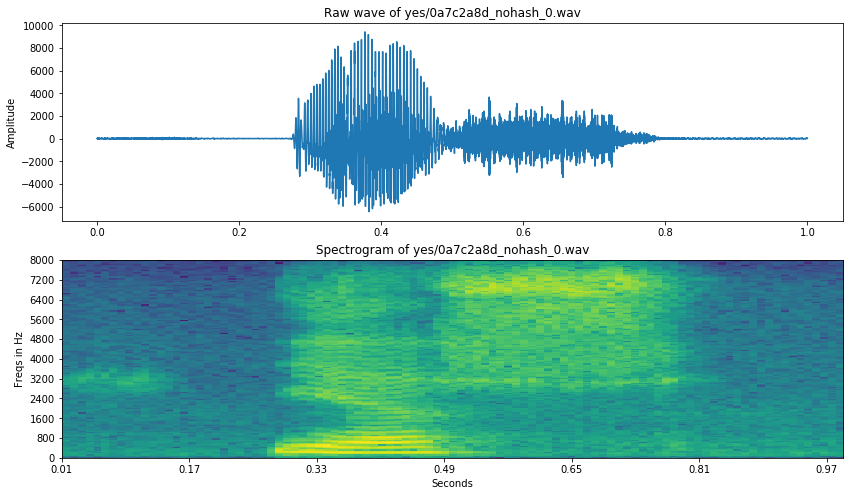

In [7]:
#주파수, 시간, 스펙트로그램을 Sample들과, Sample_Rate에 대해 값들을 계산한다.
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower',
          extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

# Original Page

If we use spectrogram as an input features for NN, we have to remember to normalize features. (We need to normalize over all the dataset, here's example just for one, which doesn't give good mean and std!)


In [8]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std

# Original Page


There is an interesting fact to point out. We have ~160 features for each frame, frequencies are between 0 and 8000. It means, that one feature corresponds to 50 Hz. However, frequency resolution of the ear is 3.6 Hz within the octave of 1000 – 2000 Hz It means, that people are far more precise and can hear much smaller details than those represented by spectrograms like above.



### 1.2. MFCC

If you want to get to know some details about MFCC take a look at this great tutorial. MFCC explained You can see, that it is well prepared to imitate human hearing properties.

You can calculate Mel power spectrogram and MFCC using for example librosa python package.

/usr/local/lib/python3.5/dist-packages/librosa/display.py:656: FutureWarning:

Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.



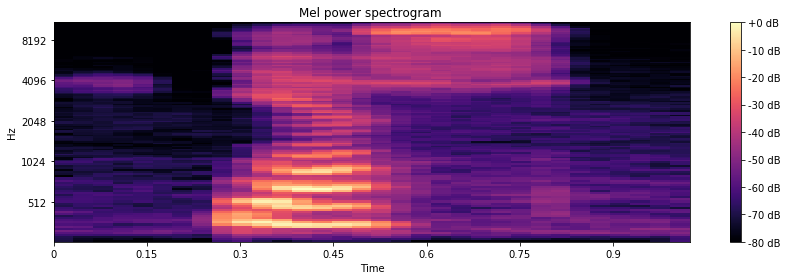

In [9]:
#이전의 예제에서는 160개의 특장들로 각각의 프레임에 대해 매칭을 했는데 0~8000Hz범위를 160개의
#특징으로 매핑하면 50Hz당 1개의 특징이 할당이 된다. 하지만 우리의 귀는 1000~2000Hz 범위에서
#3.6Hz라는 해상력(더 소리를 미세하게 구분한다는 의미인듯)을 가지기 때문에 사람이 실제로 듣는 것을
#모방하rldnlgo MFCC라는 것을 알아보자.
# From this tutorial
# https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
S = librosa.feature.melspectrogram(samples, sr = sample_rate, n_mels=128)
#melspectrogram은 Mel scale(log를 취한)로 스펙트로그램을 구한다. 

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref = np.max)
#Power spectrogram(S)를 데시벨 유닛으로 변경한다. (log 취한다.) 데시벨자체가
#소리 세기의 비를 상용로그 취한 후 10을 곱한 값.(사람이 귀로 들을 수 있는 가장 작은 소리가 0DB)

plt.figure(figsize = (12,4))
librosa.display.specshow(log_S, sr= sample_rate, x_axis='time', y_axis = 'mel')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

/usr/local/lib/python3.5/dist-packages/librosa/display.py:656: FutureWarning:

Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.



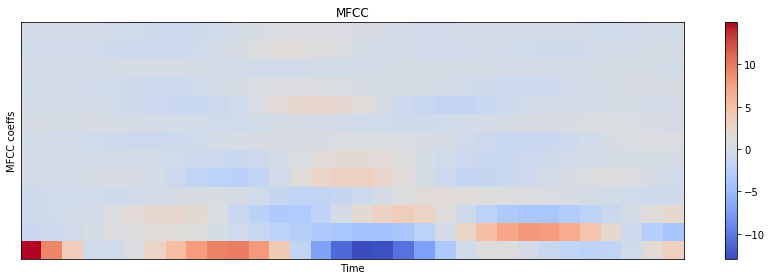

In [40]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)
#logscale(Db)로 만든 스펙트로 그램에서 나오는 mel-frequent 계수를 13개 뽑아내는 
#mfcc 코드이다.

delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

## Original Page


In classical, but still state-of-the-art systems, MFCC or similar features are taken as the input to the system instead of spectrograms.

#### 전통적으로나 최근 최첨단 시스템에서 여전히 MFCC나 비슷한 특징 들은 spectrogram들 대신에 입력값으로 사용된다.

However, in end-to-end (often neural-network based) systems, the most common input features are probably raw spectrograms, or mel power spectrograms. For example MFCC decorrelates features, but NNs deal with correlated features well. Also, if you'll understand mel filters, you may consider their usage sensible.a

#### 하지만 뉴럴넷을 기반으로한 end-to-end 시스템에서는 대부분 일반적인 특징 입력으로 raw spectrogram을 넣거나 또는 mel power spectrogram을 넣는다. 예를들어 MFCC decoreelates features들이 있다. 하지만 NN들은 correlated된 특징들을 잘 다룬다. 또한 니가 mell filter들을 잘 이해하고자 한다면, sensible.a 사용하는걸 고려하는게 좋을듯...

It is your decision which to choose!


### 1.3. Spectrogram in 3d

By the way, times change, and the tools change. Have you ever seen spectrogram in 3d?


In [11]:
freqs

array([   0.,   50.,  100.,  150.,  200.,  250.,  300.,  350.,  400.,
        450.,  500.,  550.,  600.,  650.,  700.,  750.,  800.,  850.,
        900.,  950., 1000., 1050., 1100., 1150., 1200., 1250., 1300.,
       1350., 1400., 1450., 1500., 1550., 1600., 1650., 1700., 1750.,
       1800., 1850., 1900., 1950., 2000., 2050., 2100., 2150., 2200.,
       2250., 2300., 2350., 2400., 2450., 2500., 2550., 2600., 2650.,
       2700., 2750., 2800., 2850., 2900., 2950., 3000., 3050., 3100.,
       3150., 3200., 3250., 3300., 3350., 3400., 3450., 3500., 3550.,
       3600., 3650., 3700., 3750., 3800., 3850., 3900., 3950., 4000.,
       4050., 4100., 4150., 4200., 4250., 4300., 4350., 4400., 4450.,
       4500., 4550., 4600., 4650., 4700., 4750., 4800., 4850., 4900.,
       4950., 5000., 5050., 5100., 5150., 5200., 5250., 5300., 5350.,
       5400., 5450., 5500., 5550., 5600., 5650., 5700., 5750., 5800.,
       5850., 5900., 5950., 6000., 6050., 6100., 6150., 6200., 6250.,
       6300., 6350.,

In [12]:
times

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99])

In [13]:

#spectrogram의 3d 그림을 보자.
data = [go.Surface(z=spectrogram.T)]
layout = go.Layout(
    title = 'Spectrogram of "yes" in 3d',
    scene = dict(
    yaxis = dict(title='Frequencies', range=freqs),
    xaxis = dict(title='Time', range=times),
    zaxis = dict(title='Log amplitude'),
    ),
)

fig = go.Figure(data=data,layout=layout)
py.iplot(fig)


## Original Page 

### 1.4. Silence removal

Let's listen to that file


In [14]:
ipd.Audio(samples, rate=sample_rate)

I consider that some VAD (Voice Activity Detection) will be really useful here. Although the words are short, there is a lot of silence in them. A decent VAD can reduce training size a lot, accelerating training speed significantly. Let's cut a bit of the file from the beginning and from the end. and listen to it again (based on a plot above, we take from 4000 to 13000):
 
Samples 에서 앞뒤 소리가 없는 부분은 지우도록 한다.

In [15]:
samples_cut = samples[4000:13000]
#Sample에서 필요없는 부분을 지우고
ipd.Audio(samples_cut, rate= sample_rate)
#오디오 파일 복원

We can agree that the entire word can be heard. It is impossible to cut all the files manually and do this basing on the simple plot. But you can use for example webrtcvad package to have a good VAD.
모든 파일에 대해 명확하게 단어만 들리도록 커팅하는 것은 불가능하니까 webrtcavd package를 사용해서 좋은 VAD를 얻을 수 있다.

Let's plot it again, together with guessed alignment of 'y' 'e' 's' graphems


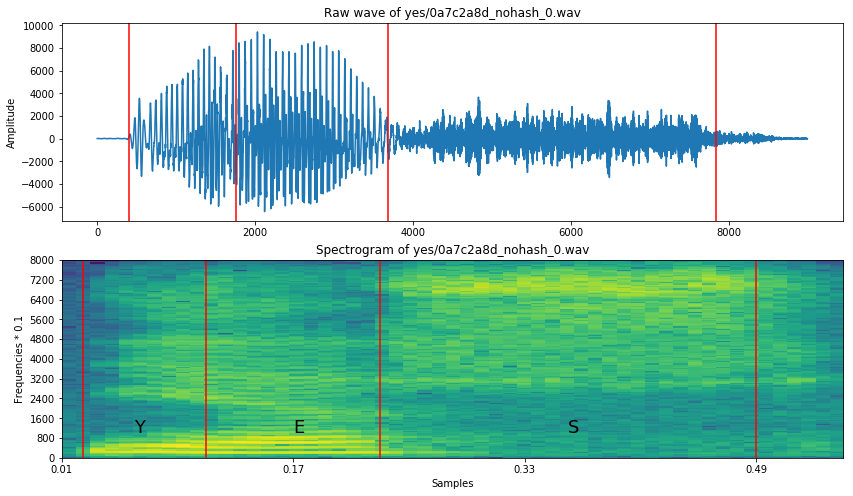

In [16]:
freqs, times, spectrogram_cut = log_specgram(samples_cut, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(samples_cut)

ax2 = fig.add_subplot(212)
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Frequencies * 0.1')
ax2.set_xlabel('Samples')
ax2.imshow(spectrogram_cut.T, aspect='auto', origin='lower',
          extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
#여기까지 동일하게 플라팅을 했는데, 이제 단어의 각 Character 별로 끊을 부분을 찾아서 글자도 넣어주고 
ax2.text(0.06, 1000, 'Y', fontsize=18)
ax2.text(0.17, 1000, 'E', fontsize=18)
ax2.text(0.36, 1000, 'S', fontsize=18)

#선도 넣어주자 근데 이것도 수작업으로 한거같다.
xcoords = [0.025, 0.11, 0.23, 0.49]
for xc in xcoords:
    ax1.axvline(x=xc*16000, c='r')
    ax2.axvline(x=xc, c='r')

## Original Page

### 1.5. Resampling - dimensionality reduction

Another way to reduce the dimensionality of our data is to resample recordings.

You can hear that the recording don't sound very natural, because they are sampled with 16k frequency, and we usually hear much more. However, the most speech related frequencies are presented in smaller band. That's why you can still understand another person talking to the telephone, where GSM signal is sampled to 8000 Hz.

- 우리는 16k 주파수보다 더 높은 주파수에서 듣는다. 하지만 대부분의 음성과 관련된 주파수는 작은 밴드에 표현되어진다. 이것이 우리가 8000hz로 샘플된 GSM 주파수에서 전화를 사용해 다른 사람의 말을 이해할 수 있는 이유이다.

Summarizing, we could resample our dataset to 8k. We will discard some information that shouldn't be important, and we'll reduce size of the data.
- 그래서 우리는 우리의 데이터셋을 8000으로 리샘플링 할 수 있다는것이다. 그리고 별로 중요하지 않은 정보들을 버릴것이다. 데이터의 사이즈도 줄일것이다.

We have to remember that it can be risky, because this is a competition, and sometimes very small difference in performance wins, so we don't want to lost anything. On the other hand, first experiments can be done much faster with smaller training size.
- 근데 이게 약간 위험하다는걸 기억해야하는데, 이거는 컴피티션에서 가끔 아주 작은 차이로 이기거나 질때도 있으니까. 그래서 우리는 아무것도 잃지 않도록 해야한다는거고, 다른말로는 첫번째 실험은 더 작은 훈련 사이즈로 빠르게 완료될 수 있다는거다.
We'll need to calculate FFT (Fast Fourier Transform). Definition:
- 우리는 FFT를 계산할 필요가있다?(쓸꺼라는거인듯.)

In [17]:
def custom_fft(y, fs):
    T = 1.0 / fs
    #Sample_rate의 역수
    N = y.shape[0]
    #데이터의 1차원의 수 (샘플의 수)
    yf = fft(y)
    #데이터를 가지고 fft를 취한후에
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    #x의 범위는 0부터 fs/2(sampling_rate의 반)까지, 쪼개는 개수는 샘플의 수를 2로 나눈 값의 정수형
    vals = 2.0/N * np.abs(yf[0:N//2])
    #벨류 값은 헷갈린다... 뭐지 이게.. 2를 샘플의 수로 나누고 그걸 fft취한 값들을 0: 샘플의 수를 2로 나눈 값의 정수형(걍 범위인듯)
    #그걸 취해서 벨류로 던져준다. 결과 적으로는 길이만 줄인거라고 할 수 있다. 
    return xf,vals

Let's read some recording, resample it, and listen. We can also compare FFT, Notice, that there is almost no information above 4000 Hz in original signal.
- 녹음 파일을 읽고, 8000hz로 리샘플링 한다음에 일단 들어보자. 또한 FFT를 비교해볼 수 있다. 여기서 알아야하는건, 원본 신호에서 4000Hz이상에 있는 것들은 거의 정보가 없다는것이다.(그러니까 4000이상에 있는거를 버려버리겠다.)

In [18]:
filename = '/happy/0b09edd3_nohash_0.wav'
new_sample_rate = 8000

sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
sample_rate

16000

In [19]:
#Sample_rate가 16000인 원본 음성 데이터, 말끔히 들림.
ipd.Audio(samples, rate= sample_rate)

In [20]:
resampled = signal.resample(samples, int(new_sample_rate/sample_rate * samples.shape[0]))

In [21]:
#Resample된 Sample_rate가 8000Hz인 음성데이터, 약간 무전기로 들리는 소리같다.
ipd.Audio(resampled, rate=new_sample_rate)

Almost no difference!
- 거의 차이가 없긴

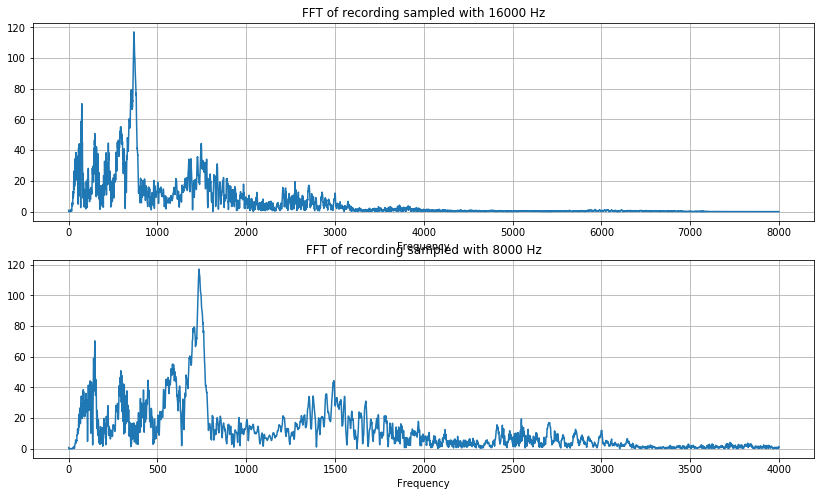

In [22]:
origin_xf, origin_vals = custom_fft(samples, sample_rate)
resampled_xf, resampled_vals = custom_fft(resampled, new_sample_rate)
fig = plt.figure(figsize=(14, 8))

ax1 = fig.add_subplot(211)
ax1.set_title('FFT of recording sampled with ' + str(sample_rate) + ' Hz')
ax1.plot(origin_xf, origin_vals)
ax1.set_xlabel('Frequency')
plt.grid()

ax2 = fig.add_subplot(212)
ax2.set_title('FFT of recording sampled with ' + str(new_sample_rate) + ' Hz')
ax2.plot(resampled_xf, resampled_vals)
ax2.set_xlabel('Frequency')
plt.grid()
plt.show()

This is how we reduced dataset size twice!
- 이렇게하면 우리의 데이터셋을 반으로 줄일 수 있다.

## Origisnal Page

### 1.6. Features extraction steps

I would propose the feature extraction algorithm like that:

    Resampling
    VAD
    Maybe padding with 0 to make signals be equal length
    Log spectrogram (or MFCC, or PLP)
    Features normalization with mean and std
    Stacking of a given number of frames to get temporal information

It's a pity it can't be done in notebook. It has not much sense to write things from zero, and everything is ready to take, but in packages, that can not be imported in Kernels.


## 2. Dataset investigation

Some usuall investgation of dataset.


### 2.1. Number of records

In [23]:
dirs = [f for f in os.listdir(train_audio_path) if isdir(join(train_audio_path, f))]
dirs.sort()
print('Number of labels: ' + str(len(dirs)))
#라벨이 몇개 있는지 확인해보자.

Number of labels: 31


In [24]:
#Calculate 각 항목마다 몇개있는지 계산해보자.
number_of_recordings=[]
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    number_of_recordings.append(len(waves))
    
#Plot
data = [go.Histogram(x=dirs, y=number_of_recordings)]
trace = go.Bar(
    x=dirs,
    y=number_of_recordings,
    marker=dict(color = number_of_recordings, colorscale='Viridius', showscale=True
               ),
)

layout = go.Layout(
    title='Number of recordings in given label',
    xaxis = dict(title='Words'),
    yaxis = dict(title='Number of recordings')
)

py.iplot(go.Figure(data=[trace], layout=layout))



Dataset is balanced except of background_noise, but that's the different thing.

소음을 제외한 데이터셋들이 대부분 균형을 맞추고 있다.


### 2.2. Deeper into recordings

There's a very important fact. Recordings come from very different sources. As far as I can tell, some of them can come from mobile GSM channel.
- 중요한 사실은 녹음 파일들이 매우 다른 곳에서 부터 왔다는건데. 예를들어 몇개는 무선 GSM 통신 채널에서 왔을거라는거?

Nevertheless, it is extremely important to split the dataset in a way that one speaker doesn't occur in both train and test sets. Just take a look and listen to this two examlpes:
- 그리고 매우 중요한게 데이터셋이 한명의 사람이 훈련 및 시험 데이터에 포함되지 않게 분리되어 있다는점. 

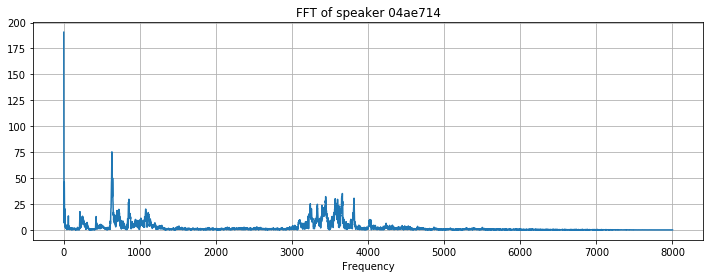

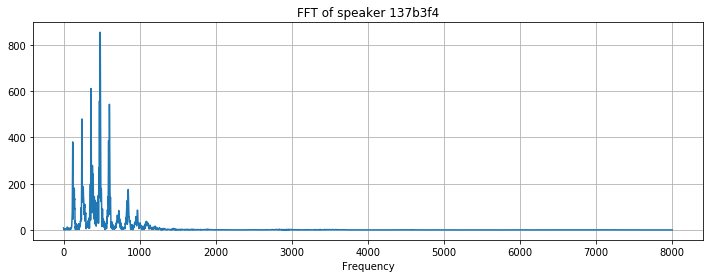

In [25]:
filenames = ['on/004ae714_nohash_0.wav', 'on/0137b3f4_nohash_0.wav']
for filename in filenames:
    sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
    xf, vals = custom_fft(samples, sample_rate)
    plt.figure(figsize = (12,4))
    plt.title('FFT of speaker ' + filename[4:11])
    plt.plot(xf, vals)
    plt.xlabel('Frequency')
    plt.grid()
    plt.show()

Even better to listen
- 백문이 불여일견이지

In [26]:
print('Speaker ' + filenames[0][4:11])
ipd.Audio(join(train_audio_path, filenames[0]))

Speaker 04ae714


In [27]:
print('Speaker ' + filenames[1][4:11])
ipd.Audio(join(train_audio_path,filenames[1]))

Speaker 137b3f4


There are also recordings with some weird silence (some compression?)

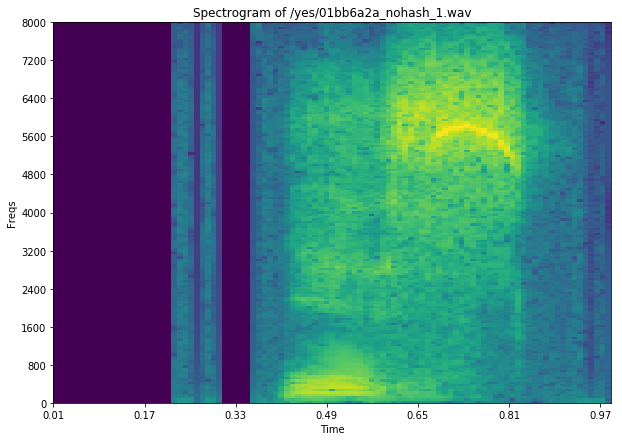

In [28]:
filename = '/yes/01bb6a2a_nohash_1.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
freqs, times, spectrogram = log_specgram(samples, sample_rate)

plt.figure(figsize=(10,7))
plt.title('Spectrogram of ' + filename)
plt.ylabel('Freqs')
plt.xlabel('Time')
plt.imshow(spectrogram.T, aspect='auto', origin='lower',
          extent = [times.min(), times.max(), freqs.min(), freqs.max()])
plt.yticks(freqs[::16])
plt.xticks(times[::16])
plt.show()

It means, that we have to prevent overfitting to the very specific acoustical envirionments
- 이거는 우리가 매우 특정한 소리적인 환경에 과적합 하는것을 막아야한다는 의미이다.

## 2.3 Recordings Length 

Find if all the files have 1 second duration:
- 길이가 1초가 안되는 파일들을 찾아보자

In [29]:
num_of_shorter = 0
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        
        #만약 샘플의 1번째 차원(샘플개수)이 샘플레이트보다 작다면(샘플레이트는 1초에 샘플링하는 수 니까.)
        #1초가 안된다는 의미이고 카운트 +1
        if samples.shape[0] < sample_rate:
            num_of_shorter += 1
print('Number of recordings shorter than 1 second: ' + str(num_of_shorter))

/usr/local/lib/python3.5/dist-packages/scipy/io/wavfile.py:273: WavFileWarning:

Chunk (non-data) not understood, skipping it.



Number of recordings shorter than 1 second: 6469


That's suprising, and there is a lot of them. We can pad them with zeros.
- 1초가 안되는게 상당이 많긴한데, 비어있는 시간은 0값 으로 채울 수 있다.

## 2.4 Mean spectrograms and FFT 

Let's plot mean FFT for every word
- 자 이제 모든 단어에 대해 FFT 평균을 보자

['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']


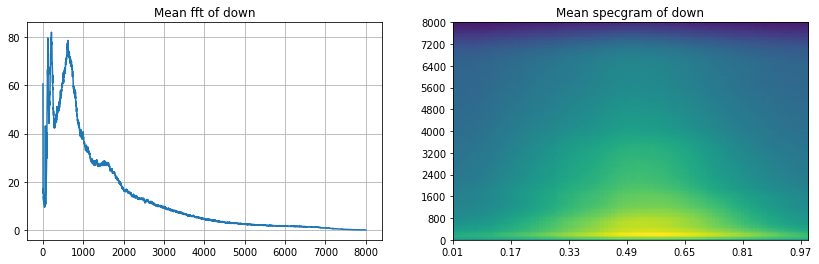

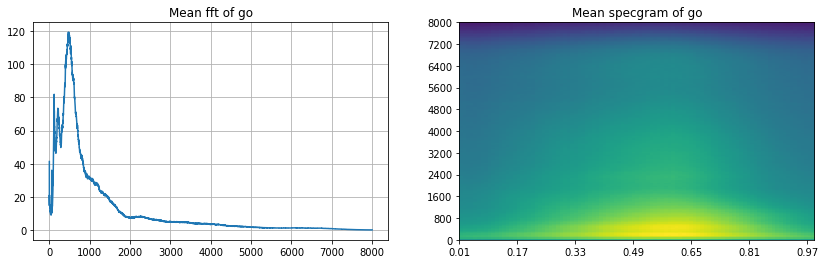

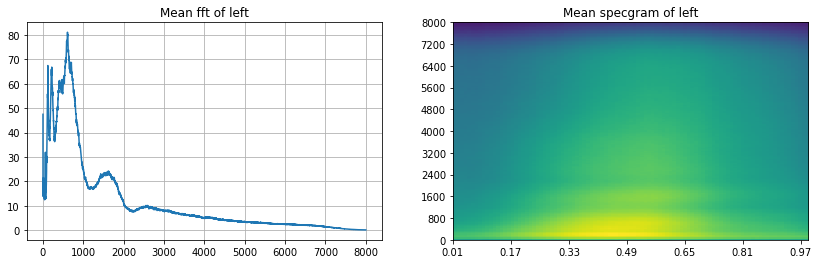

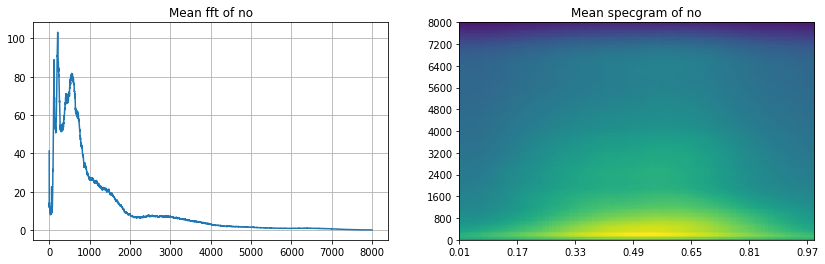

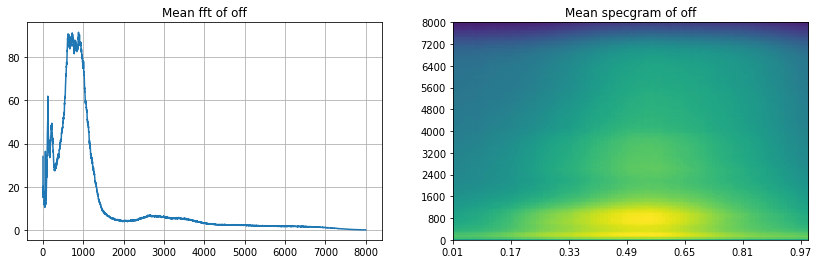

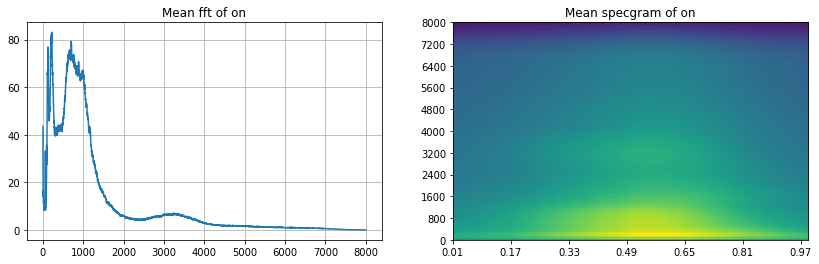

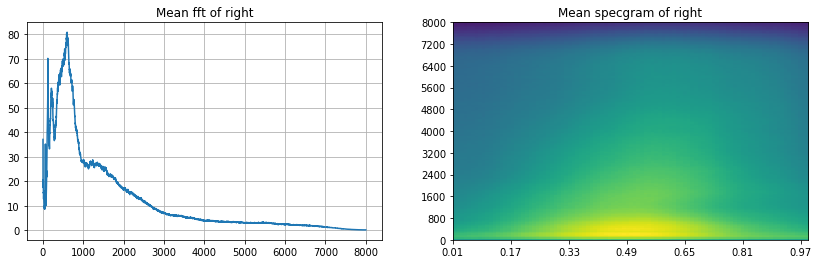

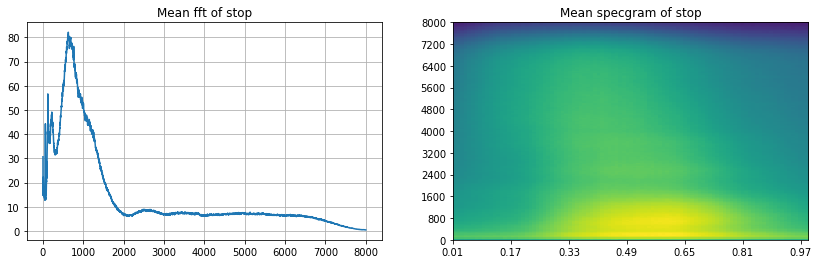

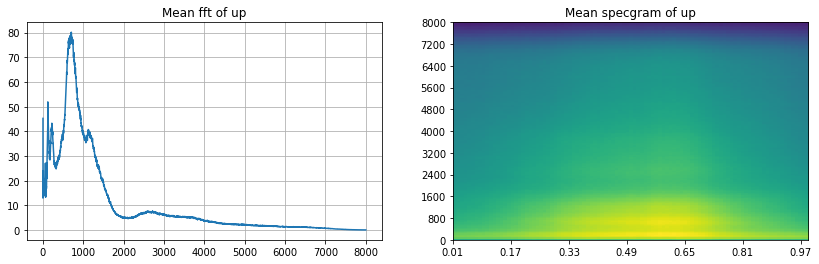

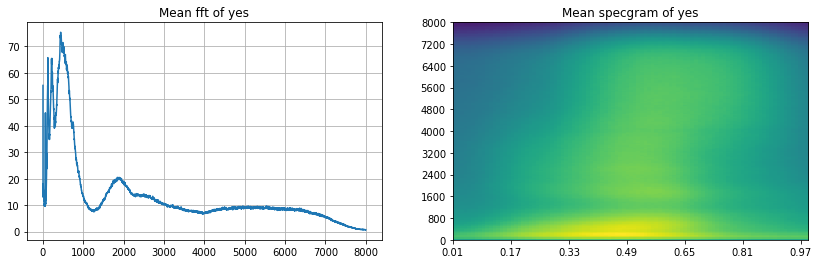

In [30]:
to_keep = 'yes no up down left right on off stop go'.split()
dirs = [d for d in dirs if d in to_keep]

print(dirs)

for direct in dirs:
    vals_all = []
    spec_all = []
    
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        #파일을 읽어다가.
        sample_rate, samples = wavfile.read(train_audio_path+direct+'/'+wav)
        #1초가 안넘으면 재끼고
        if samples.shape[0] != 16000:
            continue
        #fft 떄리자.
        xf, vals = custom_fft(samples, 16000)
        #값들은 vals_all이라는 리스트에 더해주고
        vals_all.append(vals)
        #스펙트로그램도 그려보자.
        freqs, times, spec = log_specgram(samples,16000)
        #스펙트로 그램도 spec_all 이라는 리스트에 더해주고
        spec_all.append(spec)
    #플라팅한다.
    plt.figure(figsize = (14,4))
    plt.subplot(121)
    plt.title('Mean fft of ' + direct)
    plt.plot(np.mean(np.array(vals_all), axis = 0))
    plt.grid()
    plt.subplot(122)
    plt.title('Mean specgram of ' + direct)
    #근데 위에 반복문에서 현재 word에 대한 vals값과 spectrogram 값들의 평균을 내서 플라팅하자
    plt.imshow(np.mean(np.array(spec_all), axis = 0).T, aspect='auto', origin='lower',
              extent=[times.min(), times.max(), freqs.min(), freqs.max()])
    plt.yticks(freqs[::16])
    plt.xticks(times[::16])
    plt.show()

## Gaussian Mixtures modeling 

We can see the mean FFT looks different for every word. We could model each FFT with a mixture of Gaussian distributions. Some of them however, look almost identical of FFT, like stop and up... But wait, they are still distinguishable when we look at spectrograms! High frequencies are earlier than low at the beginning of stop (probably s).
- 우리가 각각의 단어에 대한 FFT의 평균이 다르게 보이는것을 보았다. 각각의 모델에 대해 혼합 가우시안 분포를 모델할 수 있지만, stop이랑 up같은 경우는 fft 형태가 거의 비슷하게 생겼다. 하지만 spectrogram으로 구별할 수 있다. stop에서 높은 주파수는 낮은 주파수보다 먼저나온다. 아마 s발음 때문인거같다.
That's why temporal compoenet is also necessary. There is a Kaldi library, that can model words (or smaller parts of words) with GMMs and model temporal dependencies with Hidden Markov Models

We could use simple GMMs for words to check what can we model and how hard it is to distinguish the words. We can use Scikit-learn for that, however it is not straighforward and lasts very long here, so I abandon this idea for now.

- 우리는 GMM을 사용해서 우리가 각 단어에 대해 어떤것을 모델할 수 있는지 확인하고 얼마나 구분하기 어려운지 알 수 있다. Scikit-learn 라이브러리에 그게 있는데. 그거는 직관적이지 못하고 여기에서는 좀 길게 설명해야할꺼같으니까 일단은 넘어가자.

## 2.6 Frequency components across the words

In [31]:
def violinplot_frequency(dirs, freq_ind):
    
    spec_all = []
    ind = 0
    for direct in dirs:
        spec_all.append([])
        
        waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
        for wav in waves[:100]:
            sample_rate, samples = wavfile.read(train_audio_path + direct +'/' + wav)
            freqs, times, spec = log_specgram(samples, sample_rate)
            spec_all[ind].extend(spec[:, freq_ind])
        ind+=1
        
    minimum = min([len(spec) for spec in spec_all])
    spec_all = np.array([spec[:minimum] for spec in spec_all])
    
    plt.figure(figsize=(13,7))
    plt.title('Frequency ' + str(freqs[freq_ind]) + 'Hz')
    plt.ylabel('Amount of frequency in a word')
    plt.xlabel('Wrods')
    sns.violinplot(data=pd.DataFrame(spec_all.T, columns =dirs))
    plt.show()

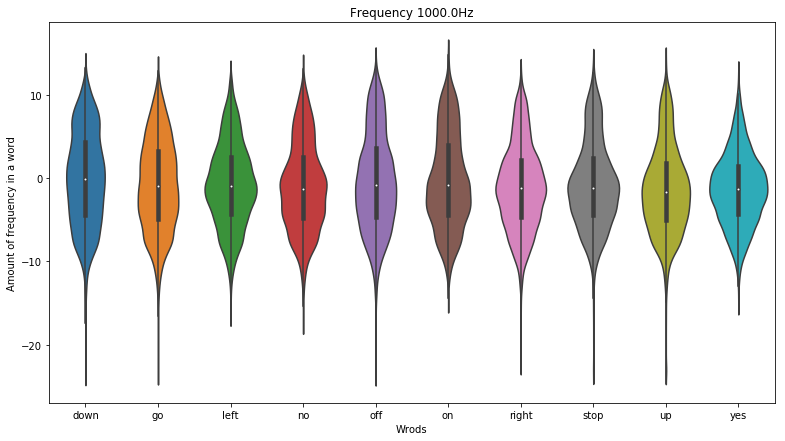

In [32]:
violinplot_frequency(dirs,20)
# 각 단어에 대해 주파수 분포를 그려주는것 같다. 2번째의 정수 매개변수는 주파수의 단계를 나타내는듯 하다.
# 정수 * 50을 하면 해당 주파수의 값이 나옴 

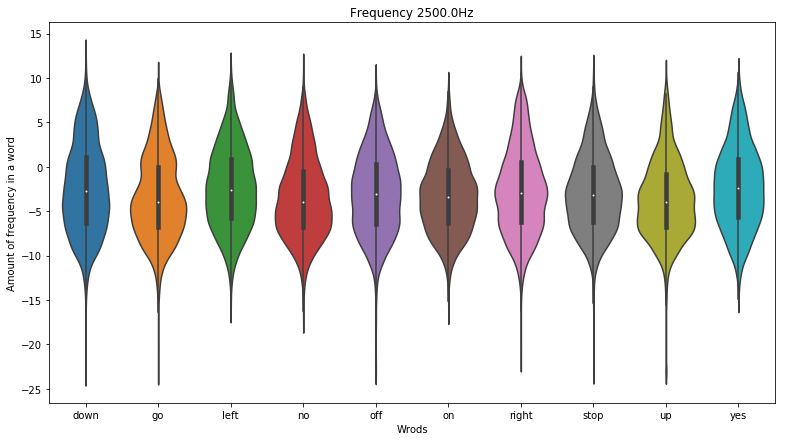

In [33]:
violinplot_frequency(dirs,50)

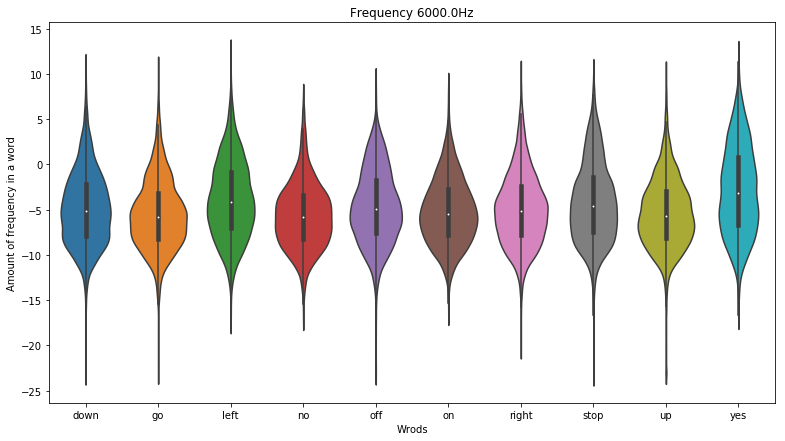

In [34]:
violinplot_frequency(dirs, 120)

## 2.7. Anomaly detection 

We should check if there are any recordings that somehow stand out from the rest. We can lower the dimensionality of the dataset and interactively check for any anomaly. We'll use PCA for dimensionality reduction
- the rest가 어떻게 번역되어야할지 모르겠는데..(안정상태?) 만약에 rest로부터 서있는 어떤 레코딩들이 있다면 우리는 확인해봐야한다. 더 낮은 차원으로 데이터셋을 축소시켜서 확인해볼 수 있고, 거기에 어떤 예외가 있는지 확인해볼 수 도있다. 우리는 PCA(Principal component analysis)라는 주요 성분 분석을 통해 차원을 축소할 것이다.

In [35]:
fft_all = []
names = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
            sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
            if samples.shape[0] != sample_rate :
                #1초가 안되는 길이의 레코드에서 빈곳은 0값으로 채워주자
                samples = np.append(samples, np.zeros((sample_rate - samples.shape[0],)))
            x, val = custom_fft(samples, sample_rate)
            fft_all.append(val)
            names.append(direct + '/' +wav)
#ndarray로 변환하고.
fft_all = np.array(fft_all)
#정규화시키자
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)
#3개의 성분(차원)으로 분석해보자.
pca = PCA(n_components=3)
#3개의 성분에 피팅하자(3차원으로 차원 축소 변환)
fft_all = pca.fit_transform(fft_all)

def interactive_3d_plot(data, names):
    scatt = go.Scatter3d(x=data[:,0], y=data[:, 1], z=data[:,2], mode = 'markers', text=names)
    data = go.Data([scatt])
    layout = go.Layout(title='Anomaly detection')
    figure = go.Figure(data=data, layout=layout)
    py.iplot(figure)


interactive_3d_plot(fft_all,names)

Notice that there are yes/e4b02540_nohash_0.wav, go/0487ba9b_nohash_0.wav and more points, that lie far away from the rest. Let's listen to them

In [36]:
print('Recording go/0487ba9b_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'go/0487ba9b_nohash_0.wav'))

Recording go/0487ba9b_nohash_0.wav


In [37]:
print('Recording yes/e4b02540_nohash_0.wav')
ipd.Audio(join(train_audio_path, 'yes/e4b02540_nohash_0.wav'))

Recording yes/e4b02540_nohash_0.wav


That's nothing obviously important. Usually you can find some distortions using this method. Data seems to contatin what it should.

### 3. Where to look for the inspiration 

you can take many different approches for the competition. I can't really advice any of that. I'd like to share my initial thoughts.

There is a trend in recent years to propose solutions based on neural networks. Usually there are two architectures. My ideas are here.

1. Encoder-decoder: https://arxiv.org/abs/1508.01211
2. RNNs with CTC loss: https://arxiv.org/abs/1412.5567
 For me, 1 and 2 are a sensible choice for this competition, especially if you do not have background in SR field. They try to be end-to-end solutions. Speech recognition is a really big topic and it would be hard to get to know important things in short time.

3. Classic speech recognition is described here: http://www.ece.ucsb.edu/Faculty/Rabiner/ece259/Reprints/tutorial%20on%20hmm%20and%20applications.pdf

You can find Kaldi Tutorial for dummies, with a problem similar to this competition in some way.

1. Very deep CNN - Don't know if it is used for SR. However, most papers concern Large Vocabulary Continuous Speech Recognition Systems (LVCSR). We got different task here - a very small vocabulary, and recordings with only one word in it, with a (mostly) given length. I suppose such approach can win the competition.